In [20]:
collection_folder = os.path.join(os.environ.get("HOME"), "code",
                                 "juan-garassino", "deepSculpt", "data")

chunk_files = [
    f for f in os.listdir(collection_folder)
    if os.path.isfile(os.path.join(collection_folder, f))
]

(len(chunk_files) // 2)

16

In [1]:
%load_ext autoreload
%autoreload 2

2023-02-27 18:50:47.911860: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-02-27 18:50:48.040935: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2023-02-27 18:50:48.040953: I tensorflow/compiler/xla/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2023-02-27 18:50:48.758788: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory
2023-


 ⏹ The color of the plane is snow

 ⏹ Working on axis shaped (48, 48)

 ⏹ Input array shaped (48, 48, 48)

 ⏹ ----------------------------

 ⏹ Output array shaped (48, 48, 48)

 ⏹ ----------------------------

 🔽 Plotting [27-02-2023-18-51-28]


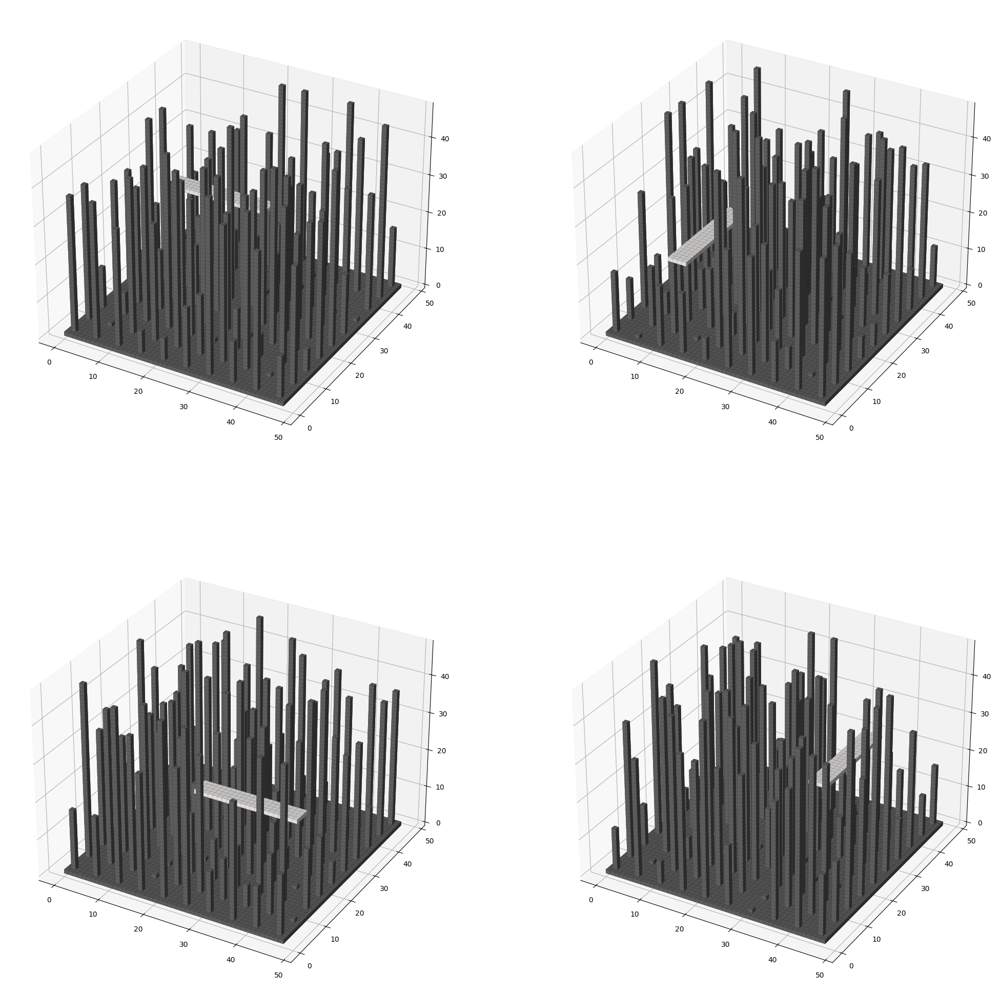

In [2]:
from deepSculpt.sculptor.components.grid_components import attach_grid
from deepSculpt.sculptor.components.plane_components import attach_plane
from deepSculpt.sculptor.components.edge_components import attach_edge
from deepSculpt.manager.tools.plotter import Plotter

import numpy as np
import os

void_dim = 48

volumes_void = np.zeros((void_dim, void_dim, void_dim))

materials_void = np.empty(volumes_void.shape, dtype=object)

separacion = 4

volumes_void, materials_void = attach_grid(volumes_void=volumes_void, materials_void=materials_void, step=separacion, verbose=False)

volumes_void, materials_void = attach_plane(volumes_void,
                                             materials_void,
                                             0.1,
                                             0.9,
                                             3,
                                             verbose=True)

volumes_void, materials_void = attach_edge(volumes_void,
                                        materials_void,
                                        0.1,
                                        0.9,
                                        3,
                                        verbose=True)

plot = Plotter(volumes=volumes_void, colors=materials_void)

out_dir = os.path.join(
                    os.environ.get("HOME"),
                    "code",
                    "juan-garassino",
                    "deepSculpt", "results"
                )

plot.plot_sculpture(out_dir)

In [3]:
from deepSculpt.manager.tools.params import COLORS
from deepSculpt.sculptor.sculptor import Sculptor
from deepSculpt.manager.tools.plotter import Plotter

import os

sculptor = Sculptor(
    void_dim=32,
    edges=(30, 0.9, 0.95),  # number of elements, minimun, maximun
    planes=(5, 0.4, 0.5),
    volumes=(3, 0.3, 0.9),
    grid=(1, 4),  # minimun height of column, and maximun height
    materials_edges=COLORS['edges'],
    materials_planes=COLORS['planes'],
    materials_volumes=COLORS['volumes'],
    step=6,
)

volumes, materials = sculptor.generative_sculpt()

plot = Plotter(volumes=volumes, colors=materials)

out_dir = os.path.join(
                    os.environ.get("HOME"),
                    "code",
                    "juan-garassino",
                    "deepSculpt", 'results'
                )

# plot.plot_sculpture(out_dir)

In [4]:
new_array = Plotter.voxel_to_pointscloud(volumes_void, 3)

new_array.shape

Plotter.plot_pointscloud(new_array[:, 0], new_array[:, 1], new_array[:, 2])

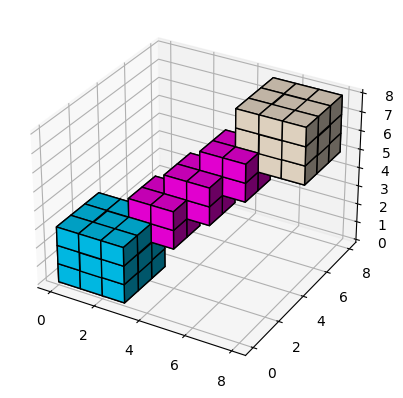

In [5]:
import matplotlib.pyplot as plt
import numpy as np

# prepare some coordinates
x, y, z = np.indices((8, 8, 8))

# draw cuboids in the top left and bottom right corners, and a link between
# them
cube1 = (x < 3) & (y < 3) & (z < 3)
cube2 = (x >= 5) & (y >= 5) & (z >= 5)
link = abs(x - y) + abs(y - z) + abs(z - x) <= 2

# combine the objects into a single boolean array
voxelarray = cube1 | cube2 | link

# set the colors of each object
colors = np.zeros(voxelarray.shape + (3, ), dtype=int)
colors[np.nonzero(link)] = (255, 0, 234)
colors[np.nonzero(cube1)] = (0, 207, 255)
colors[np.nonzero(cube2)] = (250, 235, 215)

# and plot everything
ax = plt.figure().add_subplot(projection='3d')
ax.voxels(voxelarray, facecolors=colors / 255.0, edgecolor='k')

plt.show()


In [6]:
colors.shape

(8, 8, 8, 3)

In [7]:
import matplotlib.colors as mcolors

color_dict = {}
for name, hex in mcolors.TABLEAU_COLORS.items():
    color_dict[name] = tuple(int(x * 255) for x in mcolors.to_rgb(hex))

for name, hex in mcolors.CSS4_COLORS.items():
    if name not in color_dict:
        color_dict[name] = tuple(int(x * 255) for x in mcolors.to_rgb(hex))


In [8]:
color_dict

{'tab:blue': (31, 119, 180),
 'tab:orange': (255, 127, 14),
 'tab:green': (44, 160, 44),
 'tab:red': (214, 39, 40),
 'tab:purple': (148, 103, 189),
 'tab:brown': (140, 86, 75),
 'tab:pink': (227, 119, 194),
 'tab:gray': (127, 127, 127),
 'tab:olive': (188, 189, 34),
 'tab:cyan': (23, 190, 207),
 'aliceblue': (240, 248, 255),
 'antiquewhite': (250, 235, 215),
 'aqua': (0, 255, 255),
 'aquamarine': (127, 255, 212),
 'azure': (240, 255, 255),
 'beige': (245, 245, 220),
 'bisque': (255, 228, 196),
 'black': (0, 0, 0),
 'blanchedalmond': (255, 235, 205),
 'blue': (0, 0, 255),
 'blueviolet': (138, 43, 226),
 'brown': (165, 42, 42),
 'burlywood': (222, 184, 135),
 'cadetblue': (95, 158, 160),
 'chartreuse': (127, 255, 0),
 'chocolate': (210, 105, 30),
 'coral': (255, 127, 80),
 'cornflowerblue': (100, 149, 237),
 'cornsilk': (255, 248, 220),
 'crimson': (220, 20, 60),
 'cyan': (0, 255, 255),
 'darkblue': (0, 0, 139),
 'darkcyan': (0, 139, 139),
 'darkgoldenrod': (184, 134, 11),
 'darkgray': (

In [9]:
import numpy as np


def decode_color_array(color_array, color_dict):
    """Decodes an NxNxN array of color names into an NxNxNxchannels array of RGB values."""
    n = color_array.shape[0]
    rgb_array = np.zeros((n, n, n, 3), dtype=np.uint8)
    for i in range(n):
        for j in range(n):
            for k in range(n):
                color_name = color_array[i, j, k]
                if color_name in color_dict:
                    rgb_array[i, j, k] = color_dict[color_name]
    return rgb_array


def encode_color_array(rgb_array, color_dict):
    """Encodes an NxNxNxchannels array of RGB values into an NxNxN array of color names."""
    n = rgb_array.shape[0]
    color_array = np.empty((n, n, n), dtype=np.object)
    for i in range(n):
        for j in range(n):
            for k in range(n):
                rgb_value = tuple(rgb_array[i, j, k])
                for color_name, color_rgb in color_dict.items():
                    if color_rgb == rgb_value:
                        color_array[i, j, k] = color_name
                        break
    return color_array
